In [13]:
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, date, time
import pandas as pd
import os 
import matplotlib.pyplot as plt
import seaborn as sns
import umap

sns.set(style='white', context='notebook', rc={'figure.figsize':(14,10)})



In [60]:
data_path = os.getcwd() + '/Data/'
date = datetime.now().strftime("%Y%m%d")

df = pd.read_csv(f'{data_path}celldata/celldata_expr_20240305.csv', index_col=0)

df

,Cluster_levels,Center_X,Center_Y,SampleID,BatchID,ROI_ID,CellNumber,Histone H3_c1,SMA_c2,pan Cytokeratin_c3,...,CD4_c32,CD31 / vWF_c33,CD14_c34,CCL21_c35,CD206 (MMR)_c36,Cleaved Caspase3_c37,Iridium_c38,Iridium2_c39,CD15_c40,HLA-ABC_c41
CellID,,,,,,,,,,,,,,,,,,,,,
B15-69198-1_1_1,Undefined,68.349206,9.761905,B15-69198-1,20200318,B15-69198-1_1,1,1.242234,0.794642,0.394453,...,0.459815,0.870105,0.740088,0.087191,0.150228,0.488299,3.338554,3.880843,0.095095,0.087191
B15-69198-1_1_2,Myeloid,89.095238,5.865079,B15-69198-1,20200318,B15-69198-1_1,2,1.089052,1.488847,0.047601,...,0.941778,1.163546,1.967899,0.387086,0.181541,2.047449,2.712465,3.258354,0.150228,0.251314
B15-69198-1_1_3,Undefined,157.127273,7.363636,B15-69198-1,20200318,B15-69198-1_1,3,0.286955,0.153937,0.381581,...,0.171880,0.135945,0.153937,0.018181,0.009091,0.153937,3.033770,3.589821,0.153937,0.045439
B15-69198-1_1_4,Undefined,173.149254,5.059701,B15-69198-1,20200318,B15-69198-1_1,4,0.044761,0.336876,0.074558,...,0.406613,1.207118,0.748902,0.044761,0.029846,0.392805,2.513626,3.123710,0.392805,0.178160
B15-69198-1_1_5,T cell,265.015038,5.578947,B15-69198-1,20200318,B15-69198-1_1,5,2.414764,1.524671,0.938664,...,0.595714,1.443635,1.241789,0.194265,0.216353,0.633467,2.770861,3.315642,0.289186,0.209001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
B19-15832-1_2_695,Undefined,85.154930,874.042254,B19-15832-1,20200319,B19-15832-1_2,695,0.168220,1.562953,0.014084,...,0.126424,0.182091,0.056308,0.000000,0.000000,0.056308,0.500028,0.621235,0.140384,0.056308
B19-15832-1_2_696,Undefined,173.955696,877.145570,B19-15832-1,20200319,B19-15832-1_2,696,0.406439,1.005396,0.006329,...,0.225921,0.406439,0.876891,0.082186,0.329451,0.817311,0.305359,0.685535,0.119965,0.018986
B19-15832-1_2_697,Undefined,412.258065,878.238710,B19-15832-1,20200319,B19-15832-1_2,697,0.425732,0.135073,0.019354,...,0.012903,0.109459,0.217633,0.045146,0.000000,0.045146,0.317233,0.489851,0.058032,0.032252


In [86]:
tcell_columns = ['FOXP3_c24', 'CD3_c14', 'CD8a_c26', 'CD4_c32']

In [87]:
tcells = df[df['Cluster_levels'] == 'T cell']
tcells_markers_df = tcells[tcell_columns]
tcells_markers_df

,FOXP3_c24,CD3_c14,CD8a_c26,CD4_c32
CellID,,,,
B15-69198-1_1_5,0.332202,1.217485,1.245791,0.595714
B15-69198-1_1_6,0.266934,1.013026,0.960361,0.581596
B15-69198-1_1_11,0.233175,2.118220,1.313673,1.283796
B15-69198-1_1_20,0.334171,1.280141,1.364816,0.619234
B15-69198-1_1_37,0.339875,1.447151,0.180127,1.087540
...,...,...,...,...
B19-15832-1_1_5925,0.881374,0.881374,1.818446,0.881374
B19-15832-1_2_478,0.062459,1.798495,0.124677,1.599780
B19-15832-1_2_499,0.048592,1.086049,0.048592,0.193240


In [88]:
# Perform UMAP dimensionality reduction
reducer = umap.UMAP()
embedding_tcells = reducer.fit_transform(tcells_markers_df.iloc[:,:])


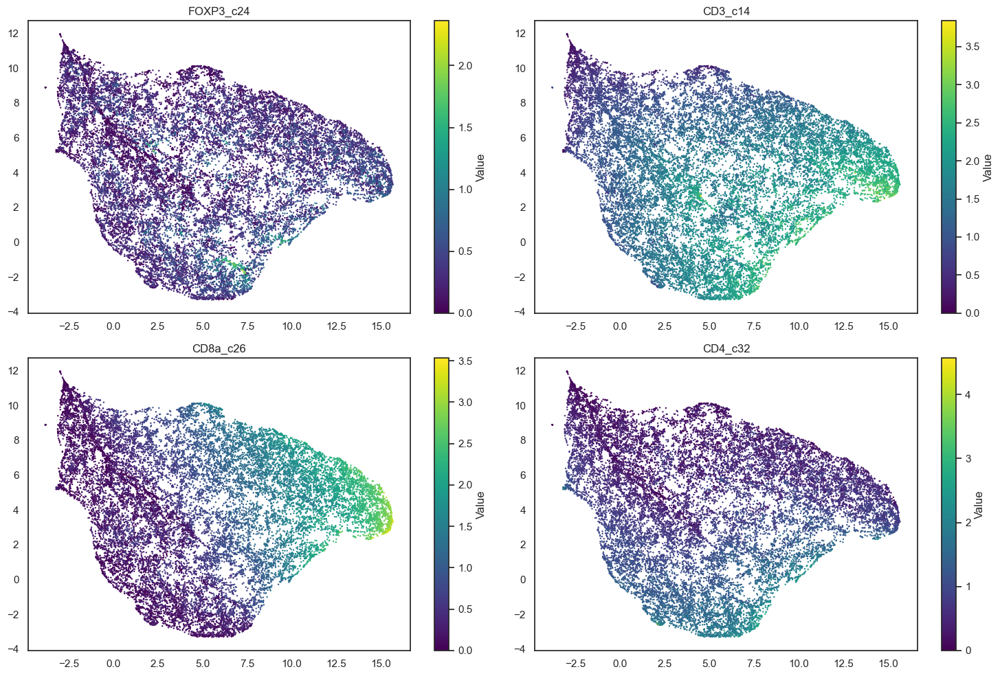

In [89]:
# Calculate number of rows and columns for subplots
num_columns = 2
num_plots = len(tcells_markers_df.columns)
num_rows = -(-num_plots // num_columns)  # Ceiling division to calculate number of rows

# Create subplots
fig, axs = plt.subplots(num_rows, num_columns, figsize=(15, 5*num_rows))

# Flatten axs if it's 2D
if num_rows > 1:
    axs = axs.flatten()

# Iterate over each column and plot histogram
# Specifiy the markers used
for i, col in enumerate(tcells_markers_df.columns):
    ax = axs[i]
    ax.scatter(embedding_tcells[:, 0], embedding_tcells[:, 1], s=0.5, c=tcells_markers_df[col], cmap='viridis')
    # ax.xlabel('UMAP Dimension 1')
    # ax.ylabel('UMAP Dimension 2')

    # Colorbar legend for each subplot
    sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=tcells_markers_df[col].min(), vmax=tcells_markers_df[col].max()))
    sm._A = []  # Fake up the array of the scalar mappable
    plt.colorbar(sm, ax=ax, label='Value')
    # ax.legend()
    ax.set_title(col)

# Remove empty subplots
for j in range(i+1, num_rows*num_columns):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.savefig(f"{data_path}plots/umaps_tcells.jpg", dpi=200)
plt.show()

In [18]:
embedding

array([[-2.708905  , -0.97792816],
       [-0.43103728, -2.968655  ],
       [-4.619395  ,  2.001139  ],
       ...,
       [-1.1024098 ,  9.008955  ],
       [-1.1897249 ,  9.047335  ],
       [-0.2681168 ,  9.302222  ]], dtype=float32)

In [65]:
# Perform UMAP dimensionality reduction
reducer = umap.UMAP()
embedding = reducer.fit_transform(df.iloc[:,7:])

Text(0.5, 1.0, 'UMAP projection of both batches')

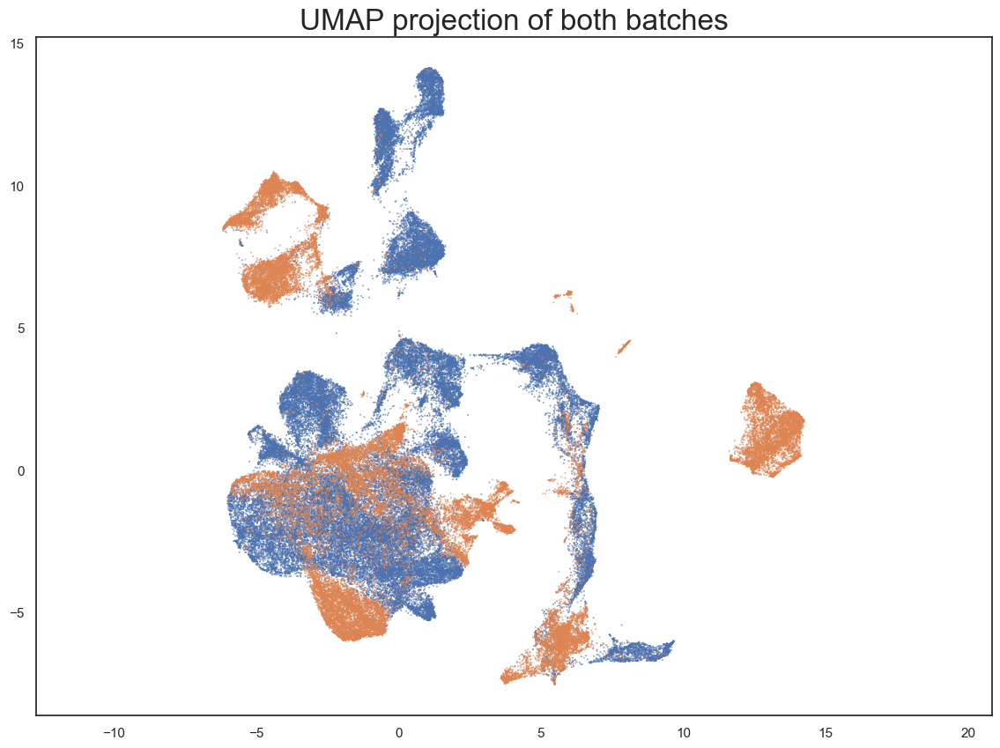

In [78]:
plt.scatter(
    embedding[:, 0],
    embedding[:, 1],
    c=[sns.color_palette()[x] for x in df.BatchID.map({20200318:0, 20200319:1})], s=0.1)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of both batches', fontsize=24)



In [26]:
df.columns[7:]

Index(['Histone H3_c1', 'SMA_c2', 'pan Cytokeratin_c3', 'CD38_c4', 'HLA-DR_c5',
       'ICOS_c6', 'CD27_c7', 'CD68_c8', 'CD163_c9', 'Siglec-1 / CD169_c10',
       'CD11b_c11', 'CD204_c12', 'IDO_c13', 'CD3_c14', 'LAG-3_c15',
       'CD45RO_c16', 'PD-1_c17', 'CD73_c18', 'CD134_c19', 'Granzyme B_c20',
       'PD-L1_c21', 'TCF1 / TCF7_c22', 'CD45_c23', 'FOXP3_c24', 'CD45RA_c25',
       'CD8a_c26', 'Carbonic Anhydrase IX_c27', 'GITR_c28', 'CD303_c29',
       'VISTA_c30', 'TMEM173_c31', 'CD4_c32', 'CD31 / vWF_c33', 'CD14_c34',
       'CCL21_c35', 'CD206 (MMR)_c36', 'Cleaved Caspase3_c37', 'Iridium_c38',
       'Iridium2_c39', 'CD15_c40', 'HLA-ABC_c41'],
      dtype='object')

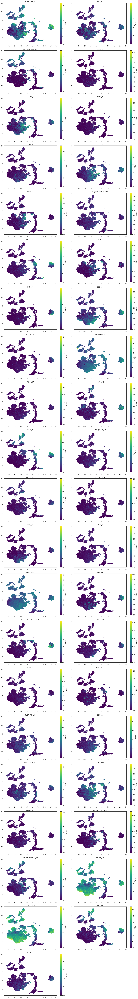

In [79]:
# Calculate number of rows and columns for subplots
num_columns = 2
num_plots = len(df.columns)
num_rows = -(-num_plots // num_columns)  # Ceiling division to calculate number of rows

# Create subplots
fig, axs = plt.subplots(num_rows, num_columns, figsize=(15, 5*num_rows))

# Flatten axs if it's 2D
if num_rows > 1:
    axs = axs.flatten()

# Iterate over each column and plot histogram
# Specifiy the markers used
for i, col in enumerate(df.columns[7:]):
    ax = axs[i]
    ax.scatter(embedding[:, 0], embedding[:, 1], s=0.5, c=df[col], cmap='viridis')
    # ax.xlabel('UMAP Dimension 1')
    # ax.ylabel('UMAP Dimension 2')

    # Colorbar legend for each subplot
    sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=df[col].min(), vmax=df[col].max()))
    sm._A = []  # Fake up the array of the scalar mappable
    plt.colorbar(sm, ax=ax, label='Value')
    # ax.legend()
    ax.set_title(col)

# Remove empty subplots
for j in range(i+1, num_rows*num_columns):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.savefig(f"{data_path}plots/umaps.jpg", dpi=200)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


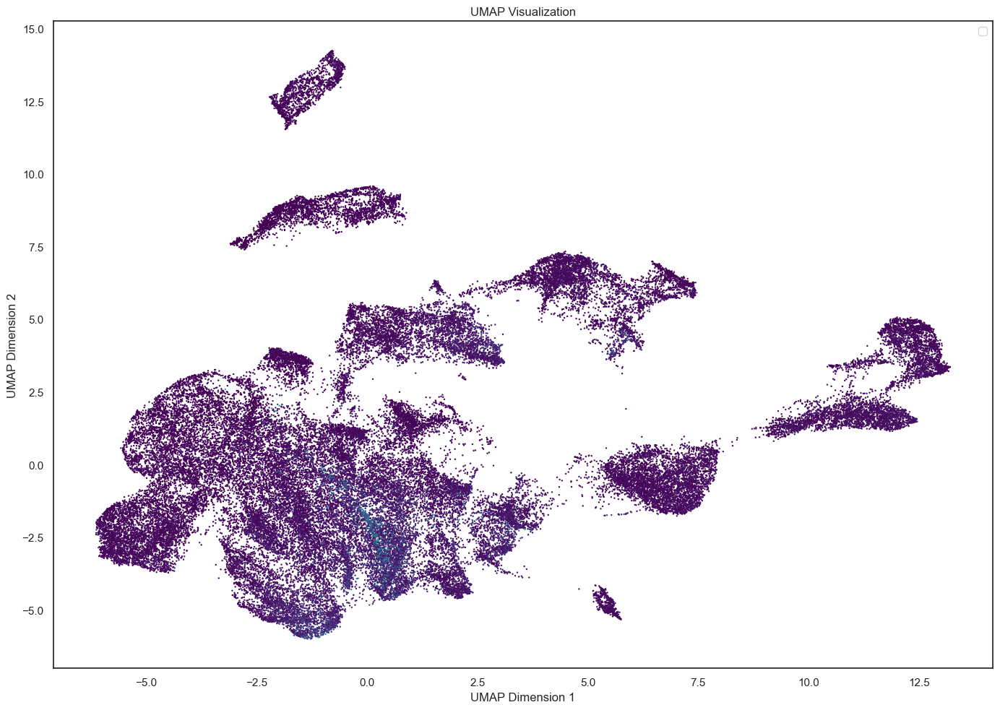

In [25]:
# Preprocess your data if necessary


# Plot the UMAP visualization
plt.scatter(embedding[:, 0], embedding[:, 1], s=0.5, c=df['CD38_c4'], cmap='viridis')
plt.title('UMAP Visualization')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.legend()
plt.tight_layout()

plt.show()